# AI4I Predictive Maintenance
[UCI Repository](https://archive.ics.uci.edu/dataset/601/ai4i+2020+predictive+maintenance+dataset)

# Loading Data
## Using UCI ML Repo

In [317]:
import math

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_theme()

In [318]:
from ucimlrepo import fetch_ucirepo
repo_id = 601
ai4i_2020_predictive_maintenance_dataset = fetch_ucirepo(id=repo_id)

In [319]:
print(ai4i_2020_predictive_maintenance_dataset.metadata['additional_info']['variable_info'])

The dataset consists of 10 000 data points stored as rows with 14 features in columns
UID: unique identifier ranging from 1 to 10000
product ID: consisting of a letter L, M, or H for low (50% of all products), medium (30%) and high (20%) as product quality variants and a variant-specific serial number
air temperature [K]: generated using a random walk process later normalized to a standard deviation of 2 K around 300 K
process temperature [K]: generated using a random walk process normalized to a standard deviation of 1 K, added to the air temperature plus 10 K.
rotational speed [rpm]: calculated from a power of 2860 W, overlaid with a normally distributed noise
torque [Nm]: torque values are normally distributed around 40 Nm with a Ïƒ = 10 Nm and no negative values. 
tool wear [min]: The quality variants H/M/L add 5/3/2 minutes of tool wear to the used tool in the process. and a
'machine failure' label that indicates, whether the machine has failed in this particular datapoint for any

In [320]:
ai4i_2020_predictive_maintenance_dataset.variables

,name,role,type,demographic,description,units,missing_values
0,UID,ID,Integer,None,None,None,no
1,Product ID,ID,Categorical,None,None,None,no
2,Type,Feature,Categorical,None,None,None,no
3,Air temperature,Feature,Continuous,None,None,K,no
4,Process temperature,Feature,Continuous,None,None,K,no
5,Rotational speed,Feature,Integer,None,None,rpm,no
6,Torque,Feature,Continuous,None,None,Nm,no
7,Tool wear,Feature,Integer,None,None,min,no
8,Machine failure,Target,Integer,None,None,None,no
9,TWF,Target,Integer,None,None,None,no


## DataFrame from CSV

In [321]:
pd.read_csv(ai4i_2020_predictive_maintenance_dataset.metadata['data_url'])

,UID,Product ID,Type,Air temperature,Process temperature,Rotational speed,Torque,Tool wear,Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,M24855,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0
9996,9997,H39410,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0
9997,9998,M24857,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0
9998,9999,H39412,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0


In [322]:
pm = pd.concat([
    ai4i_2020_predictive_maintenance_dataset.data.features,
    ai4i_2020_predictive_maintenance_dataset.data.targets], axis=1)
pm

,Type,Air temperature,Process temperature,Rotational speed,Torque,Tool wear,Machine failure,TWF,HDF,PWF,OSF,RNF
0,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0
9996,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0
9997,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0
9998,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0


# Exploring

## Basic & Columns

In [323]:
pm.columns

Index(['Type', 'Air temperature', 'Process temperature', 'Rotational speed',
       'Torque', 'Tool wear', 'Machine failure', 'TWF', 'HDF', 'PWF', 'OSF',
       'RNF'],
      dtype='object')

In [324]:
pm.duplicated().sum()

np.int64(0)

In [325]:
pm[(pm[failure_modes].sum(axis=1) >= 1) & pm["Machine failure"].eq(0)]

,Type,Air temperature,Process temperature,Rotational speed,Torque,Tool wear,Machine failure,TWF,HDF,PWF,OSF,RNF


In [326]:
failure_modes = ['TWF', 'HDF', 'PWF', 'OSF', 'RNF']
failure_names = {
    'TWF': 'Tool wear failure',
    'HDF': 'Heat Dissipation Failure',
    'PWF': 'Power Failure',
    'OSF': 'Overstrain Failure',
    'RNF': 'Random Failure'
}

Filtering for rows having multiple failure modes

In [327]:
pm[pm[failure_modes].sum(axis=1) > 1]

,Type,Air temperature,Process temperature,Rotational speed,Torque,Tool wear,Machine failure,TWF,HDF,PWF,OSF,RNF
69,L,298.9,309.0,1410,65.7,191,1,0,0,1,1,0
1324,M,298.8,310.1,1243,74.5,194,1,0,0,1,1,0
1496,L,298.0,308.7,1268,69.4,189,1,0,0,1,1,0
3611,L,301.7,310.9,1405,46.4,207,1,1,0,0,0,1
3854,L,302.4,311.0,1338,67.6,194,1,0,0,1,1,0
3943,L,302.3,311.4,1333,66.7,205,1,0,0,1,1,0
4254,L,302.6,311.0,1284,68.0,114,1,0,1,1,0,0
4342,M,301.7,309.8,1284,68.2,111,1,0,1,1,0,0
4370,L,302.0,309.9,1308,57.6,197,1,0,1,0,1,0
4383,L,301.7,309.5,1298,65.5,229,1,0,1,0,1,0


Encoding `Type` for correlation tests

In [328]:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(sparse_output=False)
type_encoded = ohe.fit_transform(pm[['Type']])
type_encoded_df = pd.DataFrame(type_encoded, columns=ohe.get_feature_names_out(['Type']))
pm = pd.concat([pm.reset_index(drop=True), type_encoded_df.reset_index(drop=True)], axis=1)
# pm.drop(columns=['Type'], inplace=True)

pm.head()

,Type,Air temperature,Process temperature,Rotational speed,Torque,Tool wear,Machine failure,TWF,HDF,PWF,OSF,RNF,Type_H,Type_L,Type_M
0,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0,0.0,0.0,1.0
1,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0,0.0,1.0,0.0
2,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0,0.0,1.0,0.0
3,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0,0.0,1.0,0.0
4,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0,0.0,1.0,0.0


### Removing RNF
Since RNF are truly random, they might affect the resulting model's performance. Also, it is not the goal to predict random failures.

In [329]:
drop_rnf_really = True

no_rnf = [fm for fm in failure_modes if fm != 'RNF']
pm[(pm[no_rnf].eq(0).all(axis=1)) & (pm['RNF'] == 1)]

,Type,Air temperature,Process temperature,Rotational speed,Torque,Tool wear,Machine failure,TWF,HDF,PWF,OSF,RNF,Type_H,Type_L,Type_M
1221,M,297.0,308.3,1399,46.4,132,0,0,0,0,0,1,0.0,0.0,1.0
1302,L,298.6,309.8,1505,45.7,144,0,0,0,0,0,1,0.0,1.0,0.0
1748,H,298.4,307.7,1626,31.1,166,0,0,0,0,0,1,1.0,0.0,0.0
2072,L,299.6,309.5,1570,35.5,189,0,0,0,0,0,1,0.0,1.0,0.0
2559,L,299.3,309.0,1447,50.4,140,0,0,0,0,0,1,0.0,1.0,0.0
3065,M,300.1,309.2,1687,27.7,95,0,0,0,0,0,1,0.0,0.0,1.0
3452,H,301.6,310.5,1602,32.3,2,0,0,0,0,0,1,1.0,0.0,0.0
5471,L,302.7,312.3,1346,61.2,170,0,0,0,0,0,1,0.0,1.0,0.0
5489,L,302.6,312.1,1499,35.0,215,0,0,0,0,0,1,0.0,1.0,0.0
5495,H,302.9,312.5,1357,55.0,12,0,0,0,0,0,1,1.0,0.0,0.0


In [330]:
if drop_rnf_really:
    pm.drop(pm[(pm[no_rnf].eq(0).all(axis=1)) & (pm['RNF'] == 1)].index, inplace=True)

    # removing RNF from targets lists
    failure_modes = no_rnf
    failure_names.pop('RNF')

    # dropping the feature
    pm.drop(['RNF'], axis=1, inplace=True)

## Correlation

In [331]:
crr = pm.corr(numeric_only=True)

In [332]:
crr

,Air temperature,Process temperature,Rotational speed,Torque,Tool wear,Machine failure,TWF,HDF,PWF,OSF,Type_H,Type_L,Type_M
Air temperature,1.000000,0.876087,0.023051,-0.014269,0.013981,0.082751,0.010009,0.138014,0.003540,0.002058,-0.023405,0.006164,0.008737
Process temperature,0.876087,1.000000,0.019925,-0.014967,0.013572,0.036158,0.007385,0.057095,-0.003269,0.004649,-0.018297,0.004839,0.006808
Rotational speed,0.023051,0.019925,1.000000,-0.875115,0.000176,-0.044299,0.010359,-0.121343,0.123019,-0.104666,-0.001093,0.005005,-0.004635
Torque,-0.014269,-0.014967,-0.875115,1.000000,-0.002876,0.191662,-0.014635,0.142841,0.083939,0.183736,-0.004952,0.000656,0.002542
Tool wear,0.013981,0.013572,0.000176,-0.002876,1.000000,0.105622,0.115934,-0.001252,-0.009311,0.156088,-0.001576,0.007330,-0.006804
Machine failure,0.082751,0.036158,-0.044299,0.191662,0.105622,1.000000,0.362894,0.575788,0.522800,0.531071,-0.023824,0.035720,-0.022585
TWF,0.010009,0.007385,0.010359,-0.014635,0.115934,0.362894,1.000000,-0.007346,0.008565,0.038231,0.011811,-0.007833,0.000640
HDF,0.138014,0.057095,-0.121343,0.142841,-0.001252,0.575788,-0.007346,1.000000,0.018425,0.046378,-0.010977,0.013440,-0.007179
PWF,0.003540,-0.003269,0.123019,0.083939,-0.009311,0.522800,0.008565,0.018425,1.000000,0.115821,-0.015498,0.004236,0.005620
OSF,0.002058,0.004649,-0.104666,0.183736,0.156088,0.531071,0.038231,0.046378,0.115821,1.000000,-0.026435,0.058509,-0.045238


<Axes: >

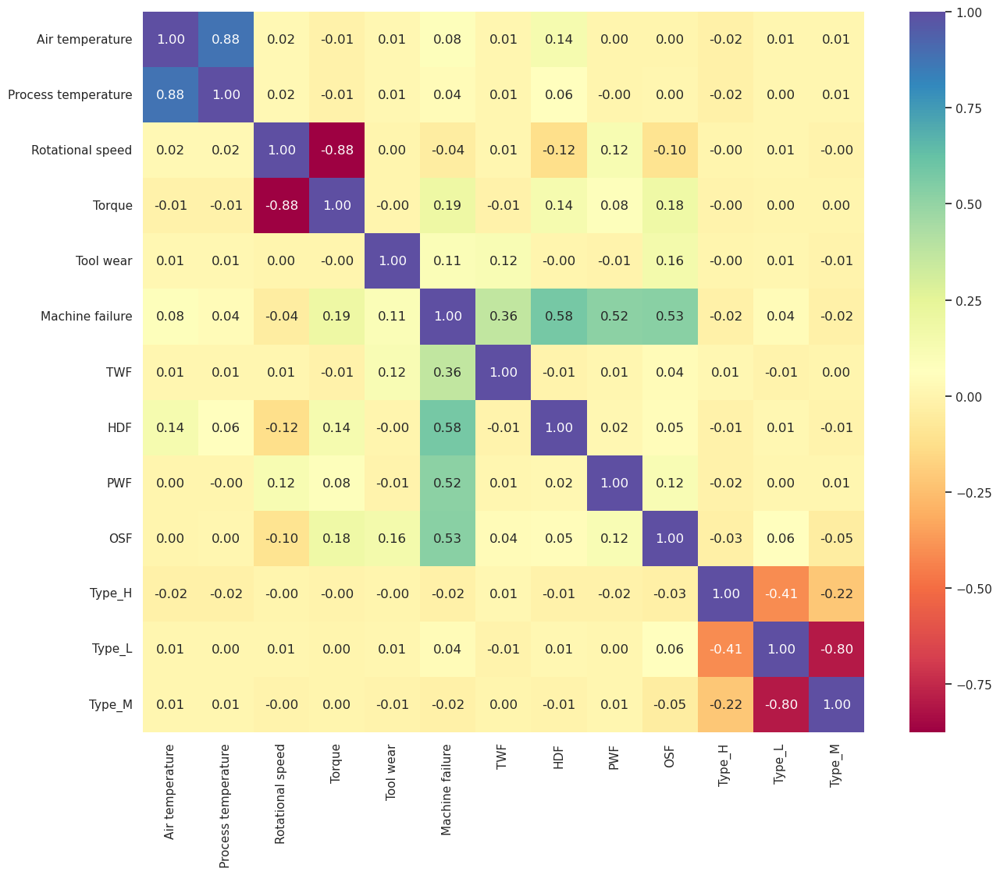

In [353]:
plt.figure(figsize=(15, 12))
sns.heatmap(crr, annot=True, fmt=".2f", cmap='Spectral', square=True)

## Clustermap

In [372]:
pm

,Type,Air temperature,Process temperature,Rotational speed,Torque,Tool wear,Machine failure,TWF,HDF,PWF,OSF,Type_H,Type_L,Type_M,temp_diff,mech_power,tool_load
0,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0.0,0.0,1.0,10.5,6951.590560,0.0
1,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0.0,1.0,0.0,10.5,6826.722724,138.9
2,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0.0,1.0,0.0,10.4,7749.387543,247.0
3,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0.0,1.0,0.0,10.4,5927.504659,276.5
4,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0.0,1.0,0.0,10.5,5897.816608,360.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0.0,0.0,1.0,9.6,4955.129373,413.0
9996,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,1.0,0.0,0.0,9.5,5434.703963,540.6
9997,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0.0,0.0,1.0,9.6,5753.617506,734.8
9998,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,1.0,0.0,0.0,9.7,7151.102638,1212.5


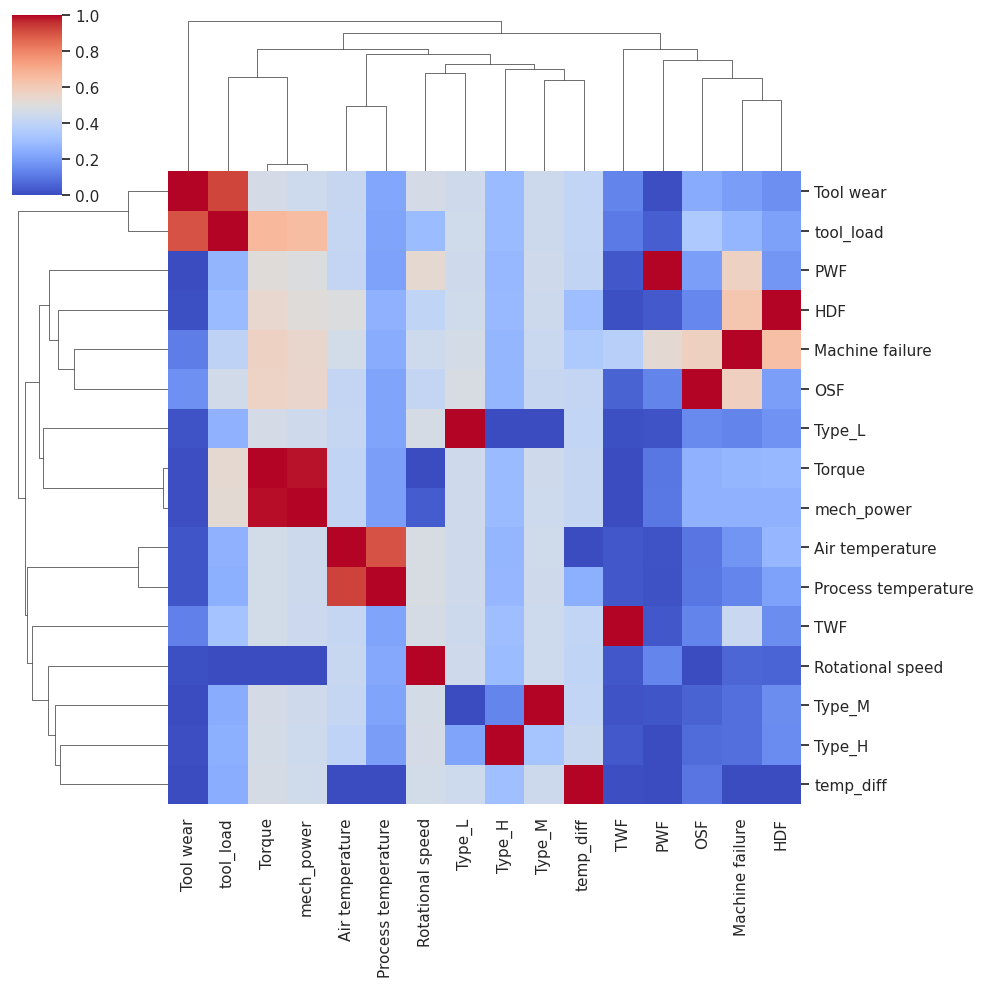

In [375]:
sns.clustermap(pm.corr(numeric_only=True), cmap='coolwarm', standard_scale=1)

## Plots

<Axes: xlabel='Air temperature', ylabel='Count'>

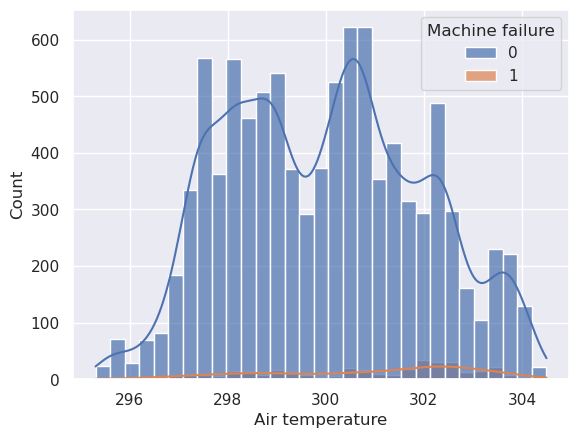

In [334]:
sns.histplot(data=pm, x='Air temperature', kde=True, alpha=0.7, hue='Machine failure')

<Axes: xlabel='Rotational speed', ylabel='Count'>

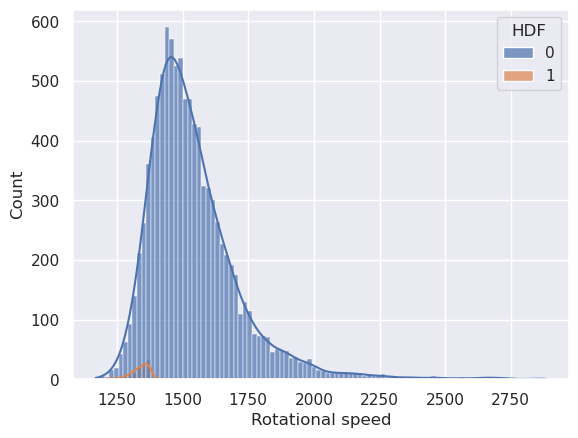

In [335]:
sns.histplot(data=pm, x='Rotational speed', kde=True, alpha=0.7, hue='HDF')

<Axes: xlabel='Tool wear', ylabel='Count'>

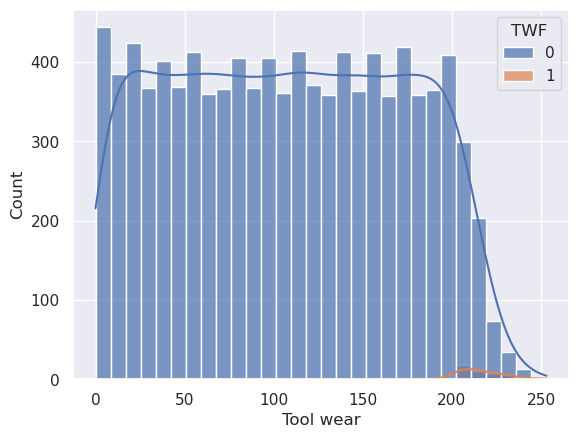

In [336]:
sns.histplot(data=pm, x='Tool wear', bins=30, kde=True, alpha=0.7, hue='TWF')

In [337]:
#sns.pairplot(data=pm, hue='Machine failure')

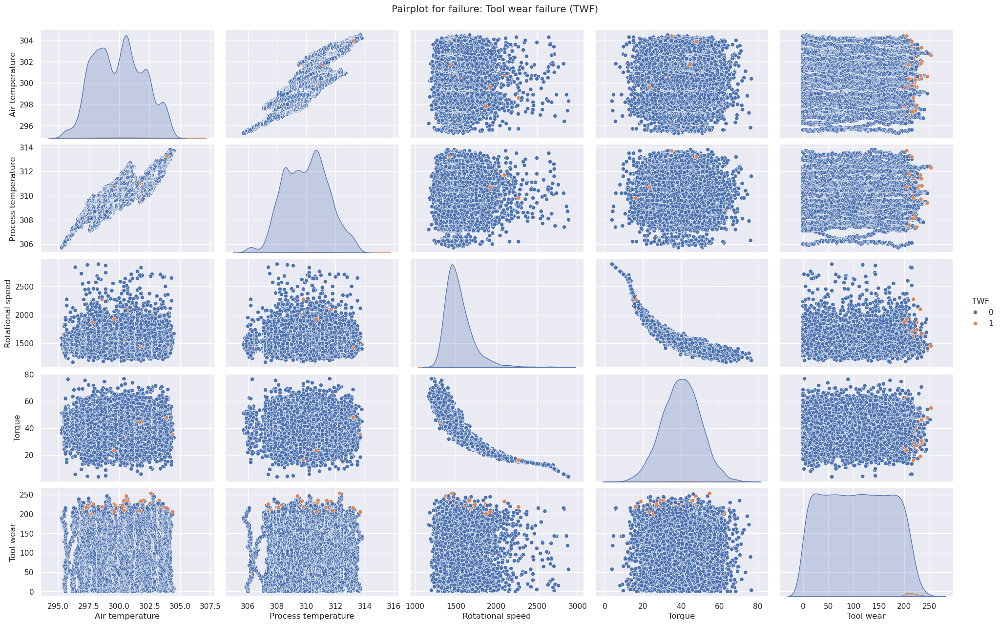

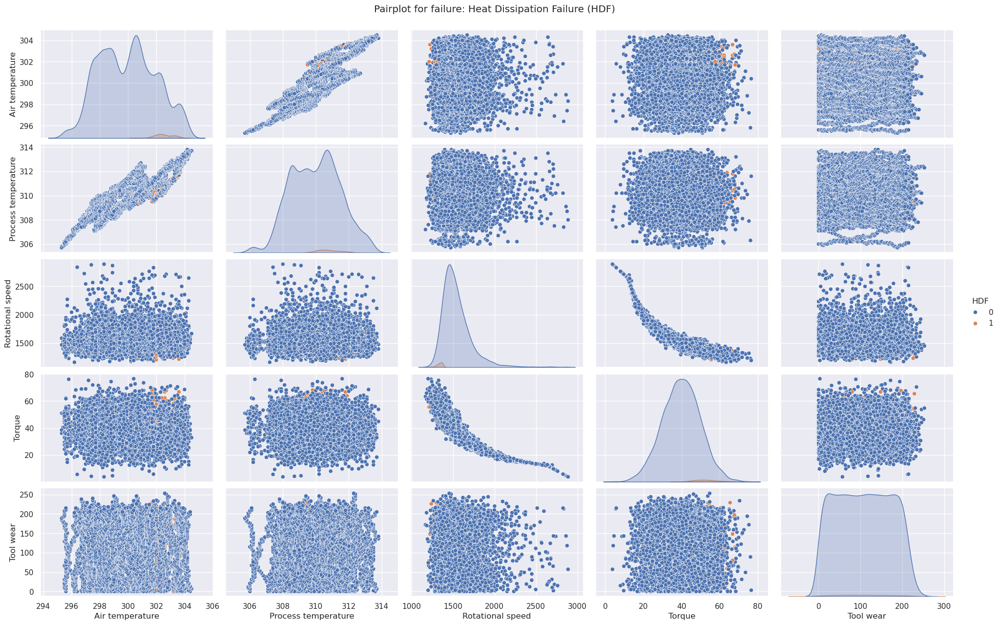

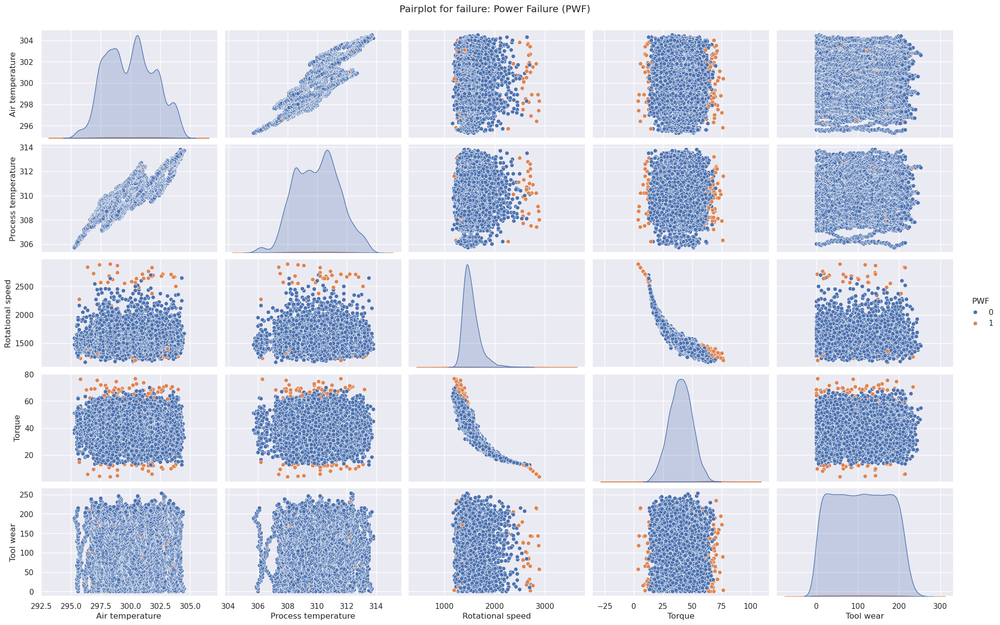

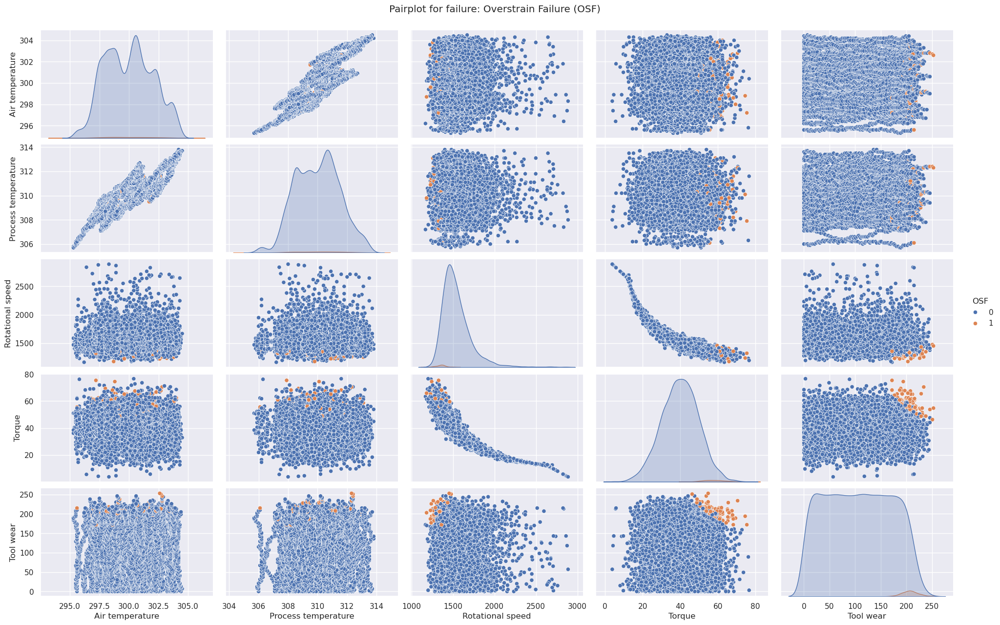

In [338]:
for col in failure_modes:
    g = sns.pairplot(data=pm[['Air temperature', 'Process temperature',
       'Rotational speed', 'Torque', 'Tool wear', col]], hue=col, aspect=1.6)
    g.figure.suptitle(f"Pairplot for failure: {failure_names[col]} ({col})", y=1.025)
    plt.show()

<Axes: xlabel='Tool wear', ylabel='Torque'>

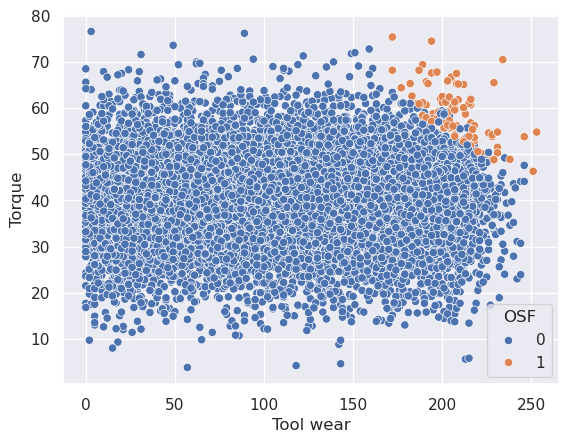

In [339]:
sns.scatterplot(data=pm, x='Tool wear', y='Torque', hue='OSF')

<Axes: xlabel='Rotational speed', ylabel='Torque'>

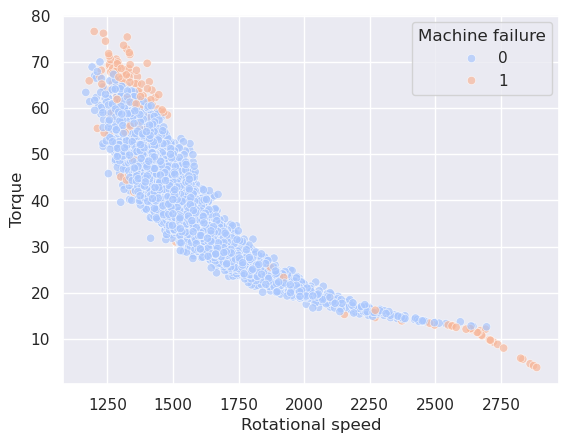

In [340]:
sns.scatterplot(data=pm, x='Rotational speed', y='Torque', hue='Machine failure', palette='coolwarm', alpha=0.7)

<Axes: xlabel='Rotational speed', ylabel='Torque'>

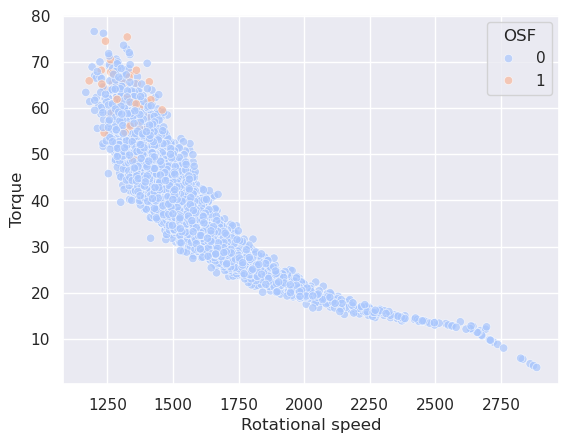

In [341]:
sns.scatterplot(data=pm, x='Rotational speed', y='Torque', hue='OSF', palette='coolwarm', alpha=0.7)

<Axes: xlabel='Machine failure', ylabel='count'>

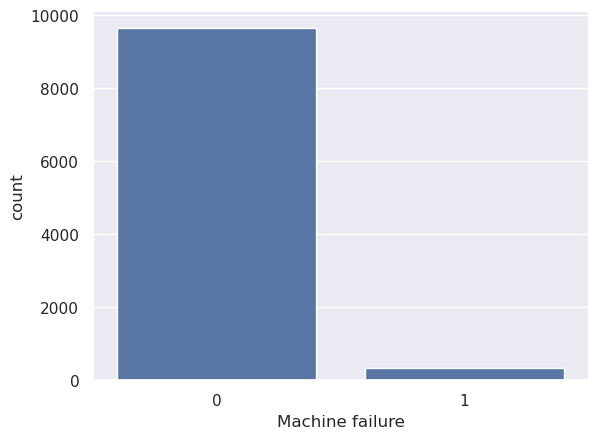

In [342]:
sns.countplot(data=pm, x='Machine failure')

[Text(0, 0, '46'), Text(0, 0, '115'), Text(0, 0, '95'), Text(0, 0, '98')]

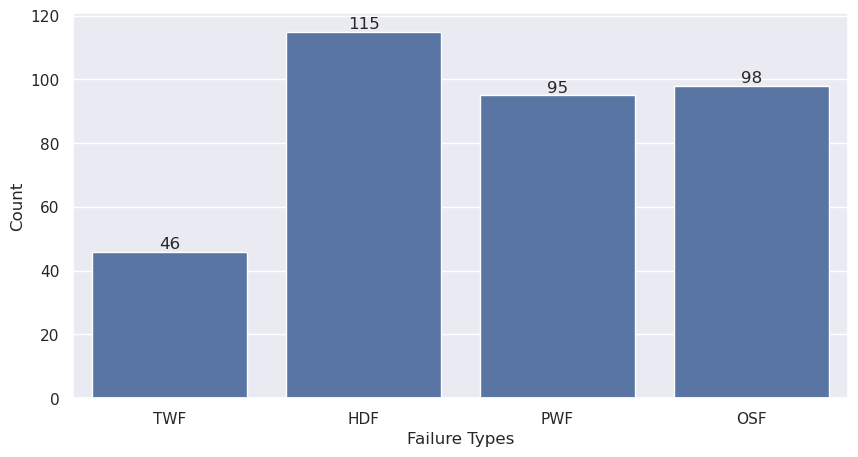

In [343]:
failure_counts = pm[failure_modes].sum()

failure_df = pd.DataFrame({'Failure Types': failure_counts.index, 'Count': failure_counts.values})

sns.set_style("darkgrid")

plt.figure(figsize=(10, 5))
ax = sns.barplot(x="Failure Types", y="Count", data=failure_df)
ax.bar_label(ax.containers[0])

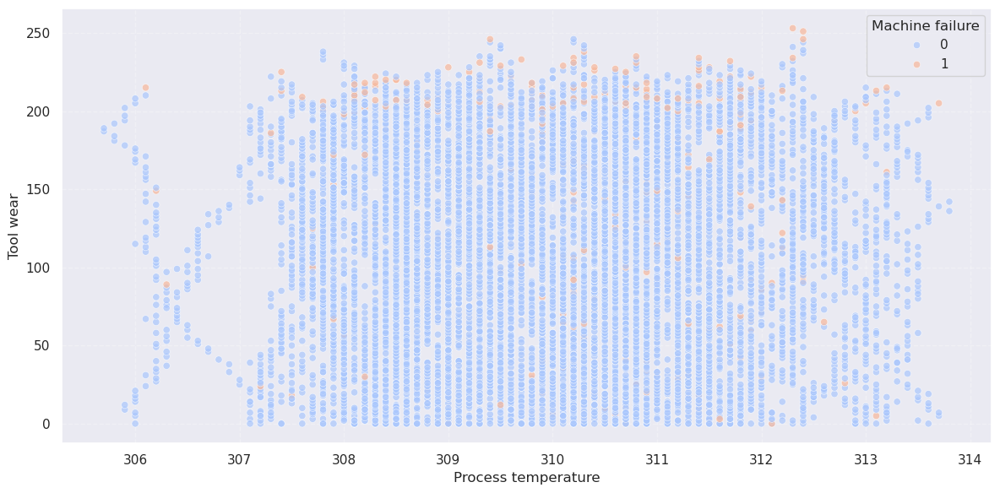

In [344]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Process temperature', y='Tool wear', hue='Machine failure', data=pm, palette='coolwarm', alpha=0.7)
plt.grid(alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

# Feature Engineering

The data documentation already marks the needed features.

In [345]:
engineered_features = []

Since **tool wear failure (TWF)** is based on already existing feature, there is no need for a new calculation/alteration:
> tool wear failure (TWF): the tool will be replaced of fail at a randomly selected **tool wear** time between 200 & 240 mins (120 times in our dataset). At this point in time, the tool is replaced 69 times, and fails 51 times (randomly assigned).

Similar approach is to take for **random failures (RNF)**:
> random failures (RNF): each process has a chance of 0,1 % to fail *regardless of its process parameters*. This is the case for only 5 datapoints, less than could be expected for 10,000 datapoints in our dataset.

## Temperature difference
> heat dissipation failure (HDF): heat dissipation causes a process failure, if the difference between air- and process temperature is below 8.6 K and the tool's rotational speed is below 1380 rpm. This is the case for 115 data points.


In [346]:
pm["temp_diff"] = pm["Process temperature"] - pm["Air temperature"]
engineered_features.append("temp_diff")

## Power
> power failure (PWF): the product of **torque** and **rotational speed** (in *rad/s*) equals the power required for the process. If this power is below 3500 W or above 9000 W, the process fails, which is the case 95 times in our dataset.

In [347]:
pm["mech_power"] = pm["Torque"] * (pm["Rotational speed"] * 2 * math.pi /60)
engineered_features.append("mech_power")

## Tool load
> overstrain failure (OSF): if the product of **tool wear** and **torque** exceeds 11,000 minNm for the L product variant (12,000 M, 13,000 H), the process fails due to overstrain. This is true for 98 datapoints.

In [348]:
pm["tool_load"] = pm["Tool wear"] * pm["Torque"]
engineered_features.append("tool_load")

## Feature Correlation

<Axes: >

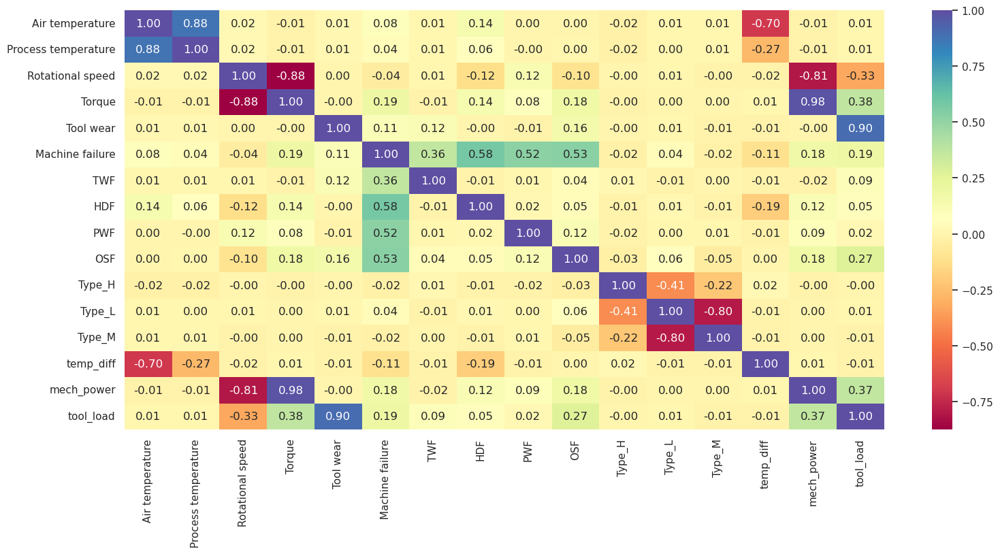

In [361]:
plt.figure(figsize=(18, 8))
sns.heatmap(pm.corr(numeric_only=True), cmap='Spectral', annot=True, fmt=".2f")

Process temperature is correlating with the base feature process temperature, since the latter depends on the former. Therefore, is it safe to remove one of them as feature, since it's also represented by temp_diff.

In [233]:
pm.drop(["Process temperature"], axis=1, inplace=True)

# dropping encoded type because it was only for correlation analysis
pm = pm.drop(pm.filter(like="Type_").columns, axis=1)

# Classification
While data preparation and training differ, for the classification, same steps have to be done for validation and forth. Also, for making the result of each model available, there is a little convention in naming the variables:
`{short_alg}_{mf|type}_{base|extended|eng_only}`

In [234]:
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.metrics import classification_report, make_scorer, f1_score
from imblearn.pipeline import Pipeline as ImbPipeline
from skopt import BayesSearchCV
from skopt.space import Integer, Real, Categorical

## Data & pipelines

In [235]:
X_full = pm.drop(['Machine failure'] + failure_modes, axis=1)
X_base =  X_full.drop(engineered_features, axis=1)
X_engineered_only = X_full[engineered_features]

y_no_types = pm['Machine failure']
y_types_only = pm[failure_modes]
y_types_only["working"] = y_types_only.sum(axis=1) == 0
y_types_only["working"] = y_types_only["working"].astype(int)

/tmp/ipykernel_234/240802434.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_types_only["working"] = y_types_only.sum(axis=1) == 0
/tmp/ipykernel_234/240802434.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_types_only["working"] = y_types_only["working"].astype(int)


In [236]:
categorical_onehot_features = ['Type']
numerical_features = ['Air temperature', 'Process temperature', 'Rotational speed', 'Torque', 'Tool wear']

ohe = OneHotEncoder(drop='first')

preprocessor_onehot = ColumnTransformer(transformers=[
    ('cat', ohe, categorical_onehot_features)
])
preprocessor_adaptive = ColumnTransformer(transformers=[
    ('num', StandardScaler(), make_column_selector(dtype_include=['int64', 'float64'])),
    ('cat', ohe, make_column_selector(dtype_include=['object', 'category']))
])

In [371]:
types_collection["random_forest"]["best_model"].named_steps["preprocessor"]["cat"].get_feature_names_out()

array(['Type_L', 'Type_M'], dtype=object)

Collections will store the returned values from `hyperparameter_tuning_bayes` including the name of the model (as key)

In [237]:
mf_collection = {}
types_collection = {}

## Function library

In [238]:
def set_pipeline_and_train(pipeline, X, y, scoring=None):
    if scoring is None:
        scoring = ['accuracy', 'f1']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=666)
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)

    target_name = y.columns if isinstance(y, pd.DataFrame) else None
    report = classification_report(y_test, y_pred, target_names=target_name, output_dict=True)
    cv_scores = cross_validate(
                    pipeline, X, y, cv=5, n_jobs=-1,
                    scoring=scoring,
                    return_train_score=True
                )
    return {
        'y_pred': y_pred,
        'report': report,
        'cv': cv_scores,
        'X': X,
        'y': y,
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test
    }

In [239]:
def hyperparameter_tuning_bayes(search_space, pipeline, result_dict, cv=5, n_iter=32, scoring=None, refit=None):
    from sklearn.metrics import matthews_corrcoef, make_scorer

    mcc_scorer = make_scorer(matthews_corrcoef)
    f1_ozans = make_scorer(f1_score, average='macro')
    # macro seems to be the best for imblanced targets

    X_train, y_train, X_test, y_test = result_dict["X_train"], result_dict["y_train"], result_dict["X_test"], result_dict["y_test"]

    if scoring is None:
        # AttributeError: 'Series' object has no attribute 'columns'
        if isinstance(result_dict["y_train"], pd.DataFrame) and result_dict["y_train"].columns.size == 1:
            scoring = "f1"
        else:
            scoring = {'f1_ozans': f1_ozans}

    if refit is None:
        if isinstance(result_dict["y_train"], pd.DataFrame) and result_dict["y_train"].columns.size == 1:
            refit = True
        else:
            refit = "f1_ozans"

    bayes_search = BayesSearchCV(
        estimator=pipeline,
        search_spaces=search_space,
        cv=cv,
        scoring=scoring,
        refit=refit,
        n_jobs=-1,
        n_iter=n_iter,
        random_state=666
    )

    bayes_search.fit(X_train, y_train)

    print("Best Parameters:", bayes_search.best_params_)
    best_model = bayes_search.best_estimator_
    y_pred = best_model.predict(X_test)
    print(classification_report(y_test, y_pred))
    cv_scores = cross_validate(
                    pipeline, result_dict["X"], result_dict["y"], cv=5, n_jobs=-1,
                    scoring=scoring,
                    return_train_score=True
                )
    return {
        'best_model': best_model,
        'classification_report': classification_report(y_test, y_pred, output_dict=True, zero_division=1),
        'bayes_search': bayes_search,
        'cv': cv_scores,
        'X_train': X_train,
        'y_train': y_train,
        'X_test': X_test,
        'y_test': y_test,
    }

## DecisionTreeClassifier

### Machine Failure

In [240]:
from sklearn.tree import DecisionTreeClassifier

dt_mf_extended = Pipeline(steps=[
    ('preprocessor', preprocessor_adaptive),
    ('classifier', DecisionTreeClassifier(random_state=666))
])

dt_X = X_full
dt_y = y_no_types

res_dt_mf_extended = set_pipeline_and_train(dt_mf_extended, dt_X, dt_y)

In [241]:
res_dt_mf_extended["cv"]

{'fit_time': array([0.04351521, 0.04527235, 0.05495691, 0.04078794, 0.03898096]),
 'score_time': array([0.00503039, 0.00504565, 0.00527883, 0.00490308, 0.00478816]),
 'test_accuracy': array([0.97346019, 0.95543315, 0.5260521 , 0.98747495, 0.98697395]),
 'train_accuracy': array([1., 1., 1., 1., 1.]),
 'test_f1': array([0.69005848, 0.51891892, 0.11423221, 0.82269504, 0.79365079]),
 'train_f1': array([1., 1., 1., 1., 1.])}

#### BayesSearch

In [242]:
dt_mf_search_space = {
    'classifier__criterion': Categorical(['gini', 'entropy']),
    'classifier__splitter': Categorical(['best', 'random']),
    'classifier__max_depth': Integer(1, 20),
    'classifier__min_samples_split': Integer(2, 20),
    'classifier__min_samples_leaf': Integer(1, 20),
    'classifier__max_features': Categorical([None, 'sqrt', 'log2']),
    'classifier__min_impurity_decrease': Real(0.0, 0.1),
    'classifier__ccp_alpha': Real(0.0, 0.1)
}

mf_collection.update([
    ("decision_tree", hyperparameter_tuning_bayes(dt_mf_search_space, dt_mf_extended, res_dt_mf_extended))
])
mf_collection["decision_tree"]["classification_report"]

Best Parameters: OrderedDict({'classifier__ccp_alpha': 0.0, 'classifier__criterion': 'gini', 'classifier__max_depth': 20, 'classifier__max_features': 'sqrt', 'classifier__min_impurity_decrease': 0.0, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 20, 'classifier__splitter': 'best'})
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2894
           1       0.81      0.73      0.77       101

    accuracy                           0.99      2995
   macro avg       0.90      0.86      0.88      2995
weighted avg       0.98      0.99      0.98      2995



{'0': {'precision': 0.9907024793388429,
  'recall': 0.9941257774706289,
  'f1-score': 0.9924111762676785,
  'support': 2894.0},
 '1': {'precision': 0.8131868131868132,
  'recall': 0.7326732673267327,
  'f1-score': 0.7708333333333334,
  'support': 101.0},
 'accuracy': 0.9853088480801335,
 'macro avg': {'precision': 0.901944646262828,
  'recall': 0.8633995223986808,
  'f1-score': 0.8816222548005059,
  'support': 2995.0},
 'weighted avg': {'precision': 0.9847161413484071,
  'recall': 0.9853088480801335,
  'f1-score': 0.9849389351536988,
  'support': 2995.0}}

In [243]:
mf_collection["decision_tree"]["cv"]

{'fit_time': array([0.04851031, 0.05244565, 0.0594418 , 0.04796362, 0.0383811 ]),
 'score_time': array([0.00430107, 0.00614166, 0.00420809, 0.005934  , 0.00395036]),
 'test_f1_ozans': array([0.83809751, 0.7477766 , 0.3953514 , 0.90810161, 0.89346275]),
 'train_f1_ozans': array([1., 1., 1., 1., 1.])}

### Types

In [244]:
dt_type_extended = Pipeline(steps=[
    ('preprocessor', preprocessor_adaptive),
    ('classifier', DecisionTreeClassifier(random_state=666))
])

dt_X = X_full
dt_y = y_types_only

res_dt_type_extended = set_pipeline_and_train(dt_type_extended, dt_X, dt_y, scoring={'f1_macro': make_scorer(f1_score, average='macro')})

/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [245]:
res_dt_type_extended["cv"]

{'fit_time': array([0.04694724, 0.04911542, 0.04777241, 0.03811932, 0.04838228]),
 'score_time': array([0.00762844, 0.00841713, 0.00840354, 0.00580072, 0.00842595]),
 'test_f1_macro': array([0.59855521, 0.73189522, 0.72180525, 0.60993738, 0.59918367]),
 'train_f1_macro': array([1., 1., 1., 1., 1.])}

#### BayesSearch

In [246]:
dt_type_search_space = {
    'classifier__criterion': Categorical(['gini', 'entropy']),
    'classifier__splitter': Categorical(['best', 'random']),
    'classifier__max_depth': Integer(1, 100),
    'classifier__min_samples_split': Integer(2, 50),
    'classifier__min_samples_leaf': Integer(1, 50),
    # 'classifier__max_features': Categorical([None, 'sqrt', 'log2']),
    # 'classifier__min_impurity_decrease': Real(0.0, 0.1),
    # 'classifier__ccp_alpha': Real(0.0, 0.1)
}
types_collection.update([
    ("decision_tree", hyperparameter_tuning_bayes(dt_type_search_space, dt_type_extended, res_dt_type_extended, n_iter=100))
])

/opt/conda/lib/python3.12/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [np.str_('gini'), np.int64(80), np.int64(1), np.int64(2), np.str_('best')] before, using random point ['entropy', np.int64(65), np.int64(47), np.int64(43), 'best']
  warnings.warn(


Best Parameters: OrderedDict({'classifier__criterion': 'gini', 'classifier__max_depth': 65, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__splitter': 'best'})
              precision    recall  f1-score   support

           0       0.10      0.07      0.08        15
           1       0.80      0.93      0.86        30
           2       1.00      1.00      1.00        28
           3       1.00      1.00      1.00        30
           4       0.99      0.99      0.99      2896

   micro avg       0.99      0.99      0.99      2999
   macro avg       0.78      0.80      0.79      2999
weighted avg       0.99      0.99      0.99      2999
 samples avg       0.99      0.99      0.99      2999



/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## XGBoost (Machine failure only)

### Training and pipeline

In [247]:
import xgboost as xgb

xgb_mf_extended = Pipeline(steps=[
    ('preprocessor', preprocessor_adaptive),
    ('classifier', xgb.XGBClassifier(random_state=666))
])

xgb_X = X_full
xgb_y = y_no_types

res_xgb_mf_extended = set_pipeline_and_train(xgb_mf_extended, xgb_X, xgb_y)

In [248]:
res_xgb_mf_extended["cv"]

{'fit_time': array([0.09048033, 0.10506773, 0.0876646 , 0.07828569, 0.10120249]),
 'score_time': array([0.01008296, 0.00958967, 0.00933266, 0.00978708, 0.0100069 ]),
 'test_accuracy': array([0.98147221, 0.97996995, 0.93036072, 0.98146293, 0.98496994]),
 'train_accuracy': array([1., 1., 1., 1., 1.]),
 'test_f1': array([0.69918699, 0.70149254, 0.4754717 , 0.70866142, 0.74137931]),
 'train_f1': array([1., 1., 1., 1., 1.])}

### Bayes Search

In [249]:
xgb_search_space_mf = {
    "classifier__n_estimators": Integer(100, 500),
    "classifier__learning_rate": Real(0.01, 0.3, prior="log-uniform"),
    "classifier__max_depth": Integer(3, 10),
    "classifier__subsample": Real(0.6, 1.0),
    "classifier__colsample_bytree": Real(0.6, 1.0),
    "classifier__reg_lambda": Real(1e-3, 10, prior="log-uniform"),
}

mf_collection.update([
    ("xgb", hyperparameter_tuning_bayes(xgb_search_space_mf, xgb_mf_extended, res_xgb_mf_extended))
])
mf_collection["xgb"]["classification_report"]

Best Parameters: OrderedDict({'classifier__colsample_bytree': 0.8662735627212164, 'classifier__learning_rate': 0.03813312665533487, 'classifier__max_depth': 3, 'classifier__n_estimators': 342, 'classifier__reg_lambda': 0.023340064219354438, 'classifier__subsample': 1.0})
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2894
           1       0.91      0.79      0.85       101

    accuracy                           0.99      2995
   macro avg       0.95      0.89      0.92      2995
weighted avg       0.99      0.99      0.99      2995



{'0': {'precision': 0.9927760577915377,
  'recall': 0.9972356599861782,
  'f1-score': 0.9950008619203585,
  'support': 2894.0},
 '1': {'precision': 0.9090909090909091,
  'recall': 0.7920792079207921,
  'f1-score': 0.8465608465608465,
  'support': 101.0},
 'accuracy': 0.9903171953255425,
 'macro avg': {'precision': 0.9509334834412233,
  'recall': 0.8946574339534852,
  'f1-score': 0.9207808542406025,
  'support': 2995.0},
 'weighted avg': {'precision': 0.9899539542794297,
  'recall': 0.9903171953255425,
  'f1-score': 0.9899950383639943,
  'support': 2995.0}}

## Random Forest

### General Machine Failure

#### Simple

In [250]:
rf_mf_extended = Pipeline(steps=[
    ('preprocessor', preprocessor_adaptive),
    ('classifier', RandomForestClassifier(random_state=666))
])

rf_mf_X = X_full
rf_mf_y = y_no_types

res_rf_mf_extended = set_pipeline_and_train(rf_mf_extended, rf_mf_X, rf_mf_y)

##### GridSearch

In [251]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [10, 20, 30, None],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

grid_search_rf = GridSearchCV(
    estimator=rf_mf_extended,
    param_grid=param_grid,
    cv=5,
    scoring='f1',
    n_jobs=-1
)

grid_search_rf.fit(rf_mf_X, rf_mf_y)

print("Best Parameters:", grid_search_rf.best_params_)
rf_mf_best_model_gridsearch = grid_search_rf.best_estimator_

y_pred_grid = rf_mf_best_model_gridsearch.predict(res_rf_mf_extended["X_test"])
print(classification_report(res_rf_mf_extended["y_test"], y_pred_grid))

Best Parameters: {'classifier__max_depth': 10, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 200}
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2894
           1       1.00      0.83      0.91       101

    accuracy                           0.99      2995
   macro avg       1.00      0.92      0.95      2995
weighted avg       0.99      0.99      0.99      2995



##### BayesSearch

In [252]:
rf_mf_search_space = {
    'classifier__n_estimators': (100, 1000),
    'classifier__max_depth': (10, 60),
    'classifier__min_samples_split': (2, 20),
    'classifier__min_samples_leaf': (1, 12)
}

mf_collection.update([
    ("random_forest", hyperparameter_tuning_bayes(rf_mf_search_space, rf_mf_extended, res_rf_mf_extended))
])
mf_collection["random_forest"]["classification_report"]

Best Parameters: OrderedDict({'classifier__max_depth': 13, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 982})
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2894
           1       0.94      0.81      0.87       101

    accuracy                           0.99      2995
   macro avg       0.97      0.91      0.93      2995
weighted avg       0.99      0.99      0.99      2995



{'0': {'precision': 0.9934662998624484,
  'recall': 0.9982722874913614,
  'f1-score': 0.9958634953464323,
  'support': 2894.0},
 '1': {'precision': 0.9425287356321839,
  'recall': 0.8118811881188119,
  'f1-score': 0.8723404255319149,
  'support': 101.0},
 'accuracy': 0.9919866444073456,
 'macro avg': {'precision': 0.9679975177473161,
  'recall': 0.9050767378050867,
  'f1-score': 0.9341019604391736,
  'support': 2995.0},
 'weighted avg': {'precision': 0.9917485389318118,
  'recall': 0.9919866444073456,
  'f1-score': 0.9916979427416689,
  'support': 2995.0}}

In [253]:
pd.DataFrame(res_rf_mf_extended["report"]).transpose()

,precision,recall,f1-score,support
0,0.993460,0.997236,0.995344,2894.000000
1,0.911111,0.811881,0.858639,101.000000
accuracy,0.990985,0.990985,0.990985,0.990985
macro avg,0.952285,0.904558,0.926991,2995.000000
weighted avg,0.990683,0.990985,0.990734,2995.000000


In [254]:
res_rf_mf_extended["cv"]['test_f1'].mean()

np.float64(0.7188697530297603)

#### Imbalance correction

In [255]:
from imblearn.over_sampling import SMOTE

rf_mf_extended_smote = ImbPipeline(steps=[
    ('preprocessor', preprocessor_adaptive),
    ('smote', SMOTE(random_state=666)),
    ('classifier', RandomForestClassifier(random_state=666))
])

res_rf_mf_extended_smote = set_pipeline_and_train(rf_mf_extended_smote, X_full, y_no_types)

pd.DataFrame(res_rf_mf_extended_smote["report"]).transpose()

,precision,recall,f1-score,support
0,0.994398,0.981341,0.987826,2894.000000
1,0.611511,0.841584,0.708333,101.000000
accuracy,0.976628,0.976628,0.976628,0.976628
macro avg,0.802954,0.911462,0.848080,2995.000000
weighted avg,0.981486,0.976628,0.978401,2995.000000


In [256]:
pd.DataFrame(res_rf_mf_extended_smote["cv"])

,fit_time,score_time,test_accuracy,train_accuracy,test_f1,train_f1
0,2.088516,0.015439,0.971457,1.0,0.674286,1.0
1,2.045739,0.016831,0.967451,1.0,0.624277,1.0
2,2.013913,0.015267,0.874749,1.0,0.345550,1.0
3,2.039843,0.016549,0.977956,1.0,0.702703,1.0
4,2.080761,0.015538,0.990481,1.0,0.845528,1.0


##### BayesSearch

In [257]:
rf_mf_search_space_smote = {
    "classifier__n_estimators": Integer(100, 500),
    "classifier__max_depth": Integer(5, 50),
    "classifier__min_samples_split": Integer(2, 50),
    "classifier__min_samples_leaf": Integer(1, 20),
    "classifier__max_features": Categorical(["sqrt", "log2", None]),
    "classifier__class_weight": Categorical([None, "balanced", "balanced_subsample"]),
    "smote__sampling_strategy": Real(0.1, 1.0, prior="log-uniform"),
    "smote__k_neighbors": Integer(2, 10),
}

mf_collection.update([
    ("random_forest_smote", hyperparameter_tuning_bayes(rf_mf_search_space_smote, rf_mf_extended_smote, res_rf_mf_extended_smote))
])
mf_collection["random_forest_smote"]["classification_report"]

Best Parameters: OrderedDict({'classifier__class_weight': None, 'classifier__max_depth': 5, 'classifier__max_features': 'log2', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 500, 'smote__k_neighbors': 2, 'smote__sampling_strategy': 0.1})
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2894
           1       0.88      0.79      0.83       101

    accuracy                           0.99      2995
   macro avg       0.94      0.89      0.91      2995
weighted avg       0.99      0.99      0.99      2995



{'0': {'precision': 0.9927685950413223,
  'recall': 0.9961990324809952,
  'f1-score': 0.9944808554674025,
  'support': 2894.0},
 '1': {'precision': 0.8791208791208791,
  'recall': 0.7920792079207921,
  'f1-score': 0.8333333333333334,
  'support': 101.0},
 'accuracy': 0.9893155258764608,
 'macro avg': {'precision': 0.9359447370811007,
  'recall': 0.8941391202008937,
  'f1-score': 0.913907094400368,
  'support': 2995.0},
 'weighted avg': {'precision': 0.9889360677264759,
  'recall': 0.9893155258764608,
  'f1-score': 0.989046498293599,
  'support': 2995.0}}

### Failure Types

In [258]:
rf_type_extended = Pipeline(steps=[
    ('preprocessor', preprocessor_adaptive),
    ('classifier', RandomForestClassifier(random_state=666, class_weight='balanced'))
])

rf_type_X = X_full
rf_type_y = y_types_only

res_rf_type_extended = set_pipeline_and_train(rf_type_extended, rf_type_X, rf_type_y, scoring={'f1_macro': make_scorer(f1_score, average='macro')})
pd.DataFrame(res_rf_type_extended["report"]).transpose()

/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sk

,precision,recall,f1-score,support
TWF,0.000000,0.000000,0.000000,15.0
HDF,0.848485,0.933333,0.888889,30.0
PWF,1.000000,0.964286,0.981818,28.0
OSF,1.000000,1.000000,1.000000,30.0
working,0.994152,0.997928,0.996037,2896.0
micro avg,0.992659,0.991997,0.992328,2999.0
macro avg,0.768527,0.779109,0.773349,2999.0
weighted avg,0.987836,0.991997,0.989890,2999.0
samples avg,0.991987,0.991987,0.991987,2999.0


In [259]:
pd.DataFrame(res_rf_type_extended["cv"])

,fit_time,score_time,test_f1_macro,train_f1_macro
0,1.065173,0.020649,0.587345,1.0
1,1.056267,0.020871,0.722360,1.0
2,0.939272,0.019980,0.582291,1.0
3,1.061492,0.021707,0.581482,1.0
4,1.053066,0.020710,0.579015,1.0


#### GridSearch

In [260]:
param_grid = {
    'classifier__n_estimators': [100, 200],
    'classifier__max_depth': [None, 10, 20],
    'classifier__min_samples_leaf': [1, 2, 5],
}

grid_search = GridSearchCV(
    rf_type_extended,
    param_grid,
    cv=5,
    scoring='f1_macro',
    n_jobs=-1
)
grid_search.fit(res_rf_type_extended["X_train"], res_rf_type_extended["y_train"])

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         StandardScaler(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x7f7512710110>),
                                                                        ('cat',
                                                                         OneHotEncoder(drop='first'),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x7f7512710380>)])),
                                       ('classifier',
                                        RandomForestClassifier(class_weight='balanced',
                                                               random_state=666))]),
             n_jobs=-1,
             param_grid={'classifier__max_depth': [None, 10, 20],
                         'classifier__min_samples_leaf': [1, 2, 5],
                         'classifier__n_estimators': [100, 200]},
             scoring='f1_macro')

In [261]:
rf_types_best_model_gridsearch = grid_search.best_estimator_

y_pred_grid = rf_types_best_model_gridsearch.predict(res_rf_type_extended["X_test"])
print(grid_search.best_params_)
print(classification_report(res_rf_type_extended["y_test"], y_pred_grid))

{'classifier__max_depth': 10, 'classifier__min_samples_leaf': 2, 'classifier__n_estimators': 100}
              precision    recall  f1-score   support

           0       0.08      0.67      0.14        15
           1       0.80      0.93      0.86        30
           2       1.00      1.00      1.00        28
           3       0.97      1.00      0.98        30
           4       1.00      0.96      0.98      2896

   micro avg       0.96      0.96      0.96      2999
   macro avg       0.77      0.91      0.79      2999
weighted avg       0.99      0.96      0.97      2999
 samples avg       0.96      0.96      0.96      2999



/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


#### BayesSearch

In [262]:
rf_type_search_space = {
    "classifier__n_estimators": Integer(100, 1000),
    "classifier__max_depth": Integer(5, 50),
    "classifier__min_samples_split": Integer(2, 50),
    "classifier__min_samples_leaf": Integer(1, 20),
    #"classifier__max_features": Categorical(["sqrt", "log2", None]),
    #"classifier__class_weight": Categorical([None, "balanced", "balanced_subsample"]),
}

types_collection.update([
    ("random_forest", hyperparameter_tuning_bayes(rf_type_search_space, rf_type_extended, res_rf_type_extended, n_iter=32))
])
types_collection["random_forest"]["classification_report"]

Best Parameters: OrderedDict({'classifier__max_depth': 20, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 1000})


/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.85      0.93      0.89        30
           2       1.00      0.93      0.96        28
           3       1.00      1.00      1.00        30
           4       0.99      1.00      1.00      2896

   micro avg       0.99      0.99      0.99      2999
   macro avg       0.77      0.77      0.77      2999
weighted avg       0.99      0.99      0.99      2999
 samples avg       0.99      0.99      0.99      2999



/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


{'0': {'precision': 1.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15.0},
 '1': {'precision': 0.8484848484848485,
  'recall': 0.9333333333333333,
  'f1-score': 0.8888888888888888,
  'support': 30.0},
 '2': {'precision': 1.0,
  'recall': 0.9285714285714286,
  'f1-score': 0.9629629629629629,
  'support': 28.0},
 '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 30.0},
 '4': {'precision': 0.9934707903780069,
  'recall': 0.9982734806629834,
  'f1-score': 0.9958663451601791,
  'support': 2896.0},
 'micro avg': {'precision': 0.991997332444148,
  'recall': 0.991997332444148,
  'f1-score': 0.991997332444148,
  'support': 2999.0},
 'macro avg': {'precision': 0.9683911277725711,
  'recall': 0.7720356485135491,
  'f1-score': 0.7695436394024061,
  'support': 2999.0},
 'weighted avg': {'precision': 0.992179377922392,
  'recall': 0.991997332444148,
  'f1-score': 0.9895493715283455,
  'support': 2999.0},
 'samples avg': {'precision': 0.9919866444073456,
  'recall': 0.991986644407345

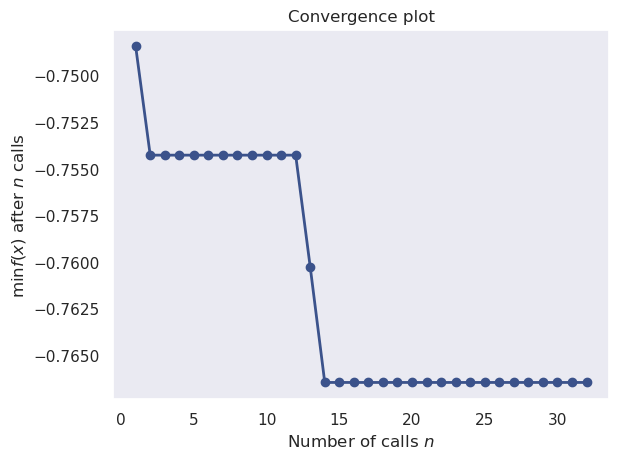

<Figure size 4000x4000 with 0 Axes>

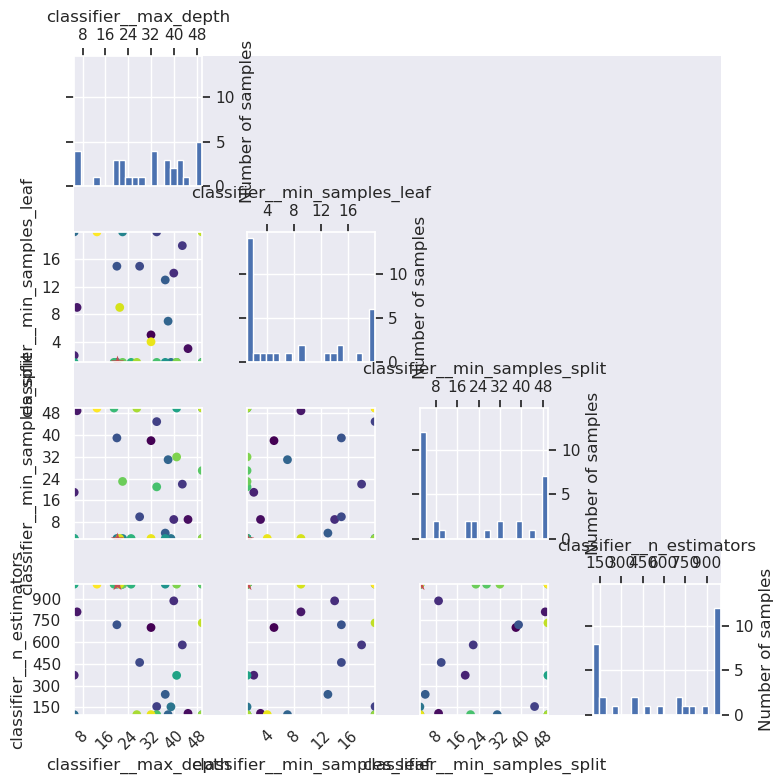

<Figure size 4000x4000 with 0 Axes>

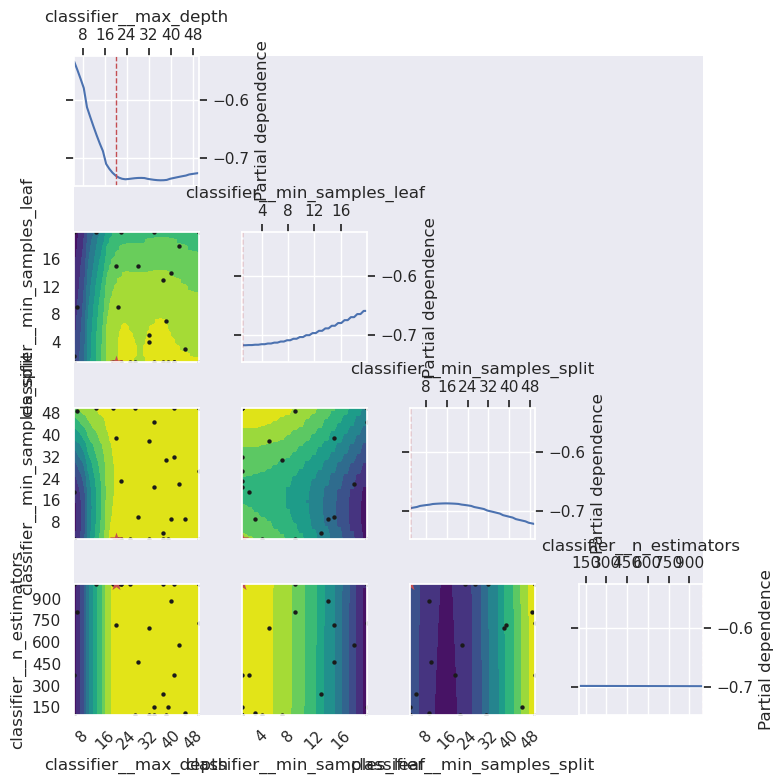

In [263]:
from skopt.plots import plot_convergence, plot_evaluations, plot_objective

result = types_collection["random_forest"]["bayes_search"].optimizer_results_[0]

plot_convergence(result)
plt.show()

figg = (40, 40)
plt.figure(figsize=figg)
plot_evaluations(result)
plt.tight_layout()
plt.show()

plt.figure(figsize=figg)
plot_objective(result)
plt.tight_layout()
plt.show()



## kNN

### Machine failure

In [264]:
from sklearn.neighbors import KNeighborsClassifier

knn_mf_extended = Pipeline(steps=[
    ('preprocessor', preprocessor_adaptive),
    ('classifier', KNeighborsClassifier(n_neighbors=3))
])

knn_mf_X = X_full
knn_mf_y = y_no_types

res_knn_mf_extended = set_pipeline_and_train(knn_mf_extended, knn_mf_X, knn_mf_y)

In [265]:
res_knn_mf_extended["cv"]

{'fit_time': array([0.01517868, 0.01824927, 0.01795888, 0.01206589, 0.01661515]),
 'score_time': array([0.0823338 , 0.1029675 , 0.09976602, 0.08340454, 0.08279681]),
 'test_accuracy': array([0.97346019, 0.97145719, 0.92184369, 0.96993988, 0.9739479 ]),
 'train_accuracy': array([0.98659987, 0.98722605, 0.98710243, 0.98685199, 0.98647633]),
 'test_f1': array([0.43010753, 0.42424242, 0.38095238, 0.42307692, 0.45833333]),
 'train_f1': array([0.77473684, 0.78017241, 0.7775378 , 0.77707006, 0.76923077])}

In [266]:
res_knn_mf_extended["report"]

{'0': {'precision': 0.9799114742934968,
  'recall': 0.9944713199723566,
  'f1-score': 0.9871377122277483,
  'support': 2894.0},
 '1': {'precision': 0.7241379310344828,
  'recall': 0.4158415841584158,
  'f1-score': 0.5283018867924528,
  'support': 101.0},
 'accuracy': 0.9749582637729549,
 'macro avg': {'precision': 0.8520247026639898,
  'recall': 0.7051564520653862,
  'f1-score': 0.7577197995101006,
  'support': 2995.0},
 'weighted avg': {'precision': 0.9712860559732428,
  'recall': 0.9749582637729549,
  'f1-score': 0.9716644506688284,
  'support': 2995.0}}

#### BayesSearch

In [267]:
knn_mf_search_space = {
    'classifier__n_neighbors': Integer(3, 30),
    'classifier__weights': Categorical(['uniform', 'distance']),
    'classifier__metric': Categorical(['euclidean', 'manhattan', 'minkowski'])
}

mf_collection.update([
    ("knn", hyperparameter_tuning_bayes(knn_mf_search_space, knn_mf_extended, res_knn_mf_extended, n_iter=32))
])
mf_collection["knn"]["classification_report"]

/opt/conda/lib/python3.12/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [np.str_('manhattan'), np.int64(3), np.str_('distance')] before, using random point ['minkowski', np.int64(5), 'uniform']
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [np.str_('manhattan'), np.int64(3), np.str_('distance')] before, using random point ['manhattan', np.int64(15), 'distance']
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [np.str_('minkowski'), np.int64(3), np.str_('distance')] before, using random point ['minkowski', np.int64(4), 'uniform']
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [np.str_('minkowski'), np.int64(3), np.str_('distance')] before, 

Best Parameters: OrderedDict({'classifier__metric': 'manhattan', 'classifier__n_neighbors': 3, 'classifier__weights': 'distance'})
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      2894
           1       0.70      0.47      0.56       101

    accuracy                           0.98      2995
   macro avg       0.84      0.73      0.77      2995
weighted avg       0.97      0.98      0.97      2995



{'0': {'precision': 0.9815573770491803,
  'recall': 0.9930891499654457,
  'f1-score': 0.9872895912057712,
  'support': 2894.0},
 '1': {'precision': 0.7014925373134329,
  'recall': 0.46534653465346537,
  'f1-score': 0.5595238095238095,
  'support': 101.0},
 'accuracy': 0.9752921535893155,
 'macro avg': {'precision': 0.8415249571813066,
  'recall': 0.7292178423094555,
  'f1-score': 0.7734067003647904,
  'support': 2995.0},
 'weighted avg': {'precision': 0.9721127864604289,
  'recall': 0.9752921535893155,
  'f1-score': 0.972864100738366,
  'support': 2995.0}}

### Failure types

In [268]:
from sklearn.neighbors import KNeighborsClassifier

knn_type_extended = Pipeline(steps=[
    ('preprocessor', preprocessor_adaptive),
    ('classifier', KNeighborsClassifier(n_neighbors=3))
])

knn_type_X = X_full
knn_type_y = y_types_only

res_knn_type_extended = set_pipeline_and_train(knn_type_extended, knn_type_X, knn_type_y, scoring={'f1_macro': make_scorer(f1_score, average='macro')})

/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sk

In [269]:
res_knn_type_extended["cv"]

{'fit_time': array([0.01743817, 0.01986098, 0.01475811, 0.01968408, 0.01915145]),
 'score_time': array([0.30943012, 0.29075217, 0.2746284 , 0.29503512, 0.32314157]),
 'test_f1_macro': array([0.47970248, 0.49558665, 0.42375758, 0.50337259, 0.41857579]),
 'train_f1_macro': array([0.72465183, 0.73781065, 0.64684271, 0.71009445, 0.7322205 ])}

#### BayesSearch

In [270]:
knn_type_search_space = {
    'classifier__n_neighbors': Integer(3, 30),
    'classifier__weights': Categorical(['uniform', 'distance']),
    'classifier__metric': Categorical(['euclidean', 'manhattan', 'minkowski'])
}

types_collection.update([
    ("knn", hyperparameter_tuning_bayes(knn_type_search_space, knn_type_extended, res_knn_type_extended, n_iter=32))
])
types_collection["knn"]["classification_report"]

/opt/conda/lib/python3.12/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [np.str_('manhattan'), np.int64(3), np.str_('distance')] before, using random point ['manhattan', np.int64(15), 'distance']
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [np.str_('manhattan'), np.int64(3), np.str_('distance')] before, using random point ['minkowski', np.int64(4), 'uniform']
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [np.str_('manhattan'), np.int64(3), np.str_('distance')] before, using random point ['euclidean', np.int64(9), 'uniform']
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [np.str_('manhattan'), np.int64(3), np.str_('distance')] before, 

Best Parameters: OrderedDict({'classifier__metric': 'manhattan', 'classifier__n_neighbors': 4, 'classifier__weights': 'distance'})
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.60      0.30      0.40        30
           2       0.83      0.54      0.65        28
           3       0.79      0.73      0.76        30
           4       0.98      0.99      0.99      2896

   micro avg       0.98      0.98      0.98      2999
   macro avg       0.64      0.51      0.56      2999
weighted avg       0.97      0.98      0.97      2999
 samples avg       0.98      0.98      0.98      2999



/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sk

{'0': {'precision': 1.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15.0},
 '1': {'precision': 0.6, 'recall': 0.3, 'f1-score': 0.4, 'support': 30.0},
 '2': {'precision': 0.8333333333333334,
  'recall': 0.5357142857142857,
  'f1-score': 0.6521739130434783,
  'support': 28.0},
 '3': {'precision': 0.7857142857142857,
  'recall': 0.7333333333333333,
  'f1-score': 0.7586206896551724,
  'support': 30.0},
 '4': {'precision': 0.9812670299727521,
  'recall': 0.9948204419889503,
  'f1-score': 0.9879972565157751,
  'support': 2896.0},
 'micro avg': {'precision': 0.9766433099766433,
  'recall': 0.9759919973324441,
  'f1-score': 0.97631754503002,
  'support': 2999.0},
 'macro avg': {'precision': 0.8400629298040743,
  'recall': 0.5127736122073138,
  'f1-score': 0.5597583718428851,
  'support': 2999.0},
 'weighted avg': {'precision': 0.974209430045299,
  'recall': 0.9759919973324441,
  'f1-score': 0.9717437629625065,
  'support': 2999.0},
 'samples avg': {'precision': 0.9766277128547579,
  'recall': 

## MLP

### Machine failure

In [271]:
from sklearn.neural_network import MLPClassifier

mlp_mf_extended = Pipeline(steps=[
    ('preprocessor', preprocessor_adaptive),
    ('classifier', MLPClassifier(hidden_layer_sizes=(100,), max_iter=300))
])

mlp_mf_X = X_full
mlp_mf_y = y_no_types

res_mlp_mf_extended = set_pipeline_and_train(mlp_mf_extended, mlp_mf_X, mlp_mf_y)

In [272]:
res_mlp_mf_extended["cv"]

{'fit_time': array([3.00971174, 2.83517885, 2.5452826 , 3.25974464, 2.91935992]),
 'score_time': array([0.00516057, 0.00507522, 0.00522637, 0.00516868, 0.00541544]),
 'test_accuracy': array([0.9784677 , 0.97496244, 0.88627255, 0.9749499 , 0.97895792]),
 'train_accuracy': array([0.98772699, 0.98860363, 0.99010769, 0.98860506, 0.98610068]),
 'test_f1': array([0.60550459, 0.5       , 0.35694051, 0.55357143, 0.5625    ]),
 'train_f1': array([0.8       , 0.80842105, 0.83975659, 0.81081081, 0.74943567])}

In [273]:
res_mlp_mf_extended["report"]

{'0': {'precision': 0.9866117404737385,
  'recall': 0.9930891499654457,
  'f1-score': 0.9898398484587567,
  'support': 2894.0},
 '1': {'precision': 0.7560975609756098,
  'recall': 0.6138613861386139,
  'f1-score': 0.6775956284153005,
  'support': 101.0},
 'accuracy': 0.9803005008347245,
 'macro avg': {'precision': 0.8713546507246741,
  'recall': 0.8034752680520298,
  'f1-score': 0.8337177384370287,
  'support': 2995.0},
 'weighted avg': {'precision': 0.9788381404305628,
  'recall': 0.9803005008347245,
  'f1-score': 0.9793100767644698,
  'support': 2995.0}}

#### BayesSearch

In [274]:
mlp_mf_search_space = {
    #'classifier__hidden_layer_sizes': Categorical([(50,), (100,)]),
    'classifier__alpha': Real(1e-4, 1e-2, prior='log-uniform'),
    'classifier__learning_rate_init': Real(0.0001, 0.1, prior='log-uniform')
}

mf_collection.update([
    ("mlp", hyperparameter_tuning_bayes(mlp_mf_search_space, mlp_mf_extended, res_mlp_mf_extended, n_iter=64))
])

/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptro

Best Parameters: OrderedDict({'classifier__alpha': 0.0001, 'classifier__learning_rate_init': 0.001987609964233527})
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2894
           1       0.73      0.66      0.69       101

    accuracy                           0.98      2995
   macro avg       0.86      0.83      0.84      2995
weighted avg       0.98      0.98      0.98      2995



### Failure types

In [275]:
from sklearn.neural_network import MLPClassifier

mlp_type_extended = Pipeline(steps=[
    ('preprocessor', preprocessor_adaptive),
    ('classifier', MLPClassifier(hidden_layer_sizes=(100,), max_iter=300))
])

res_mlp_type_extended = set_pipeline_and_train(mlp_type_extended, X_full, y_types_only, scoring={'f1_macro': make_scorer(f1_score, average='macro')})

/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter 

In [276]:
res_mlp_type_extended["report"]

{'TWF': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15.0},
 'HDF': {'precision': 0.8620689655172413,
  'recall': 0.8333333333333334,
  'f1-score': 0.847457627118644,
  'support': 30.0},
 'PWF': {'precision': 0.9259259259259259,
  'recall': 0.8928571428571429,
  'f1-score': 0.9090909090909091,
  'support': 28.0},
 'OSF': {'precision': 0.8571428571428571,
  'recall': 0.8,
  'f1-score': 0.8275862068965517,
  'support': 30.0},
 'working': {'precision': 0.9883201648917898,
  'recall': 0.993439226519337,
  'f1-score': 0.9908730842087137,
  'support': 2896.0},
 'micro avg': {'precision': 0.9849799732977303,
  'recall': 0.9839946648882961,
  'f1-score': 0.9844870725604671,
  'support': 2999.0},
 'macro avg': {'precision': 0.7266915826955629,
  'recall': 0.7039259405419627,
  'f1-score': 0.7150015654629638,
  'support': 2999.0},
 'weighted avg': {'precision': 0.9802192324549357,
  'recall': 0.9839946648882961,
  'f1-score': 0.9820854659364575,
  'support': 2999.0},
 'samples a

In [277]:
res_mlp_type_extended["cv"]

{'fit_time': array([4.49745584, 4.45600677, 4.44967675, 4.53877068, 4.41493034]),
 'score_time': array([0.00592089, 0.00593972, 0.00594664, 0.00581074, 0.00604296]),
 'test_f1_macro': array([0.54733466, 0.67458283, 0.59803706, 0.59403321, 0.55401656]),
 'train_f1_macro': array([0.80521941, 0.80187889, 0.75356308, 0.80666292, 0.81448533])}

#### BayesSearch

In [278]:
mlp_type_search_space = {
    #'classifier__hidden_layer_sizes': Categorical([(50,), (100,)]),
    'classifier__alpha': Real(1e-4, 1e-2, prior='log-uniform'),
    'classifier__learning_rate_init': Real(0.0001, 0.1, prior='log-uniform')
}

types_collection.update([
    ("mlp", hyperparameter_tuning_bayes(mlp_type_search_space, mlp_type_extended, res_mlp_type_extended, n_iter=64))
])

/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptro

Best Parameters: OrderedDict({'classifier__alpha': 0.002751249156188292, 'classifier__learning_rate_init': 0.007145740479091614})
              precision    recall  f1-score   support

           0       0.50      0.07      0.12        15
           1       0.92      0.77      0.84        30
           2       0.96      0.79      0.86        28
           3       0.85      0.93      0.89        30
           4       0.99      0.99      0.99      2896

   micro avg       0.98      0.98      0.98      2999
   macro avg       0.84      0.71      0.74      2999
weighted avg       0.98      0.98      0.98      2999
 samples avg       0.98      0.98      0.98      2999



/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter 

## MLP - Tensorflow

In [279]:
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import numpy as np
import pandas as pd

X_preprocessed = preprocessor_adaptive.fit_transform(X_full)

input_dim = X_preprocessed.shape[1]

model = models.Sequential([
    layers.InputLayer(input_shape=(input_dim,)),
    layers.Dense(100, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

# binary_crossentropy for binary classification
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

history = model.fit(X_preprocessed, y_no_types, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50


/opt/conda/lib/python3.12/site-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8831 - loss: 0.3895 - val_accuracy: 0.9805 - val_loss: 0.1020
Epoch 2/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - accuracy: 0.9636 - loss: 0.1466 - val_accuracy: 0.9800 - val_loss: 0.0821
Epoch 3/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - accuracy: 0.9664 - loss: 0.1162 - val_accuracy: 0.9810 - val_loss: 0.0671
Epoch 4/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - accuracy: 0.9655 - loss: 0.1067 - val_accuracy: 0.9830 - val_loss: 0.0625
Epoch 5/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - accuracy: 0.9672 - loss: 0.1016 - val_accuracy: 0.9820 - val_loss: 0.0613
Epoch 6/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - accuracy: 0.9685 - loss: 0.0967 - val_accuracy: 0.9825 - val_loss: 0.0585
Epoch 7/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - accuracy: 0.9685 - loss: 0.0886 - val_accuracy: 0.9830 - val_loss: 0.0563
Epoch 8/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - accuracy: 0.9711 - loss: 0.0887 - val_accuracy:

In [280]:
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
import kerastuner as kt

X_train, X_val, y_train, y_val = train_test_split(X_preprocessed, y_no_types, test_size=0.2, random_state=42)

def build_model(hp):
    model = models.Sequential()
    model.add(layers.InputLayer(input_shape=(input_dim,)))

    # Tuning the number of hidden layers between 1 and 3
    for i in range(hp.Int('num_layers', 1, 3)):
        # Tuning the number of neurons for each hidden layer
        units = hp.Int(f'units_{i}', min_value=32, max_value=256, step=32)
        model.add(layers.Dense(units=units, activation='relu'))

        if hp.Boolean(f'dropout_{i}'):
            dropout_rate = hp.Float(f'dropout_rate_{i}', min_value=0.1, max_value=0.5, step=0.1)
            model.add(layers.Dropout(rate=dropout_rate))

    model.add(layers.Dense(1, activation='sigmoid'))

    lr = hp.Float('learning_rate', 1e-4, 1e-2, sampling='log')
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model

tuner = kt.BayesianOptimization(
    build_model,
    objective='val_accuracy',
    max_trials=10,
    directory='bayesian_opt_dir',
    project_name='mlp_tuning'
)

tuner.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

best_model = tuner.get_best_models(num_models=1)[0]

val_loss, val_accuracy = best_model.evaluate(X_val, y_val)
print(f'Best model validation accuracy: {val_accuracy:.4f}')


Reloading Tuner from bayesian_opt_dir/mlp_tuning/tuner0.json
 1/63 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - accuracy: 0.9375 - loss: 0.1814

/opt/conda/lib/python3.12/site-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - accuracy: 0.9853 - loss: 0.0518
Best model validation accuracy: 0.9855


In [281]:
import numpy as np
from sklearn.metrics import classification_report

y_pred_prob = best_model.predict(X_val)

y_pred = (y_pred_prob > 0.5).astype("int32")

print(classification_report(y_val, y_pred))

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1920
           1       0.88      0.73      0.79        77

    accuracy                           0.99      1997
   macro avg       0.93      0.86      0.89      1997
weighted avg       0.98      0.99      0.98      1997



In [282]:
import tensorflow as tf

model.save('mlp_tf.h5')
#loaded_model = tf.keras.models.load_model('mlp_tf.h5')

converter = tf.lite.TFLiteConverter.from_keras_model(loaded_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

tflite_model = converter.convert()

with open('mlp_tf.tflite', 'wb') as f:
    f.write(tflite_model)

INFO:tensorflow:Assets written to: /tmp/tmpmwfb_lg8/assets


INFO:tensorflow:Assets written to: /tmp/tmpmwfb_lg8/assets


Saved artifact at '/tmp/tmpmwfb_lg8'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 9), dtype=tf.float32, name='input_layer_1')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  140143529481552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140143530324432: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140143350731344: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140143350732880: TensorSpec(shape=(), dtype=tf.resource, name=None)
Model saved as mlp_tf.h5 and converted to mlp_tf.tflite


W0000 00:00:1740120243.650308     234 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1740120243.650323     234 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
2025-02-21 06:44:03.650483: I tensorflow/cc/saved_model/reader.cc:83] Reading SavedModel from: /tmp/tmpmwfb_lg8
2025-02-21 06:44:03.650874: I tensorflow/cc/saved_model/reader.cc:52] Reading meta graph with tags { serve }
2025-02-21 06:44:03.650888: I tensorflow/cc/saved_model/reader.cc:147] Reading SavedModel debug info (if present) from: /tmp/tmpmwfb_lg8
2025-02-21 06:44:03.653128: I tensorflow/cc/saved_model/loader.cc:236] Restoring SavedModel bundle.
2025-02-21 06:44:03.665789: I tensorflow/cc/saved_model/loader.cc:220] Running initialization op on SavedModel bundle at path: /tmp/tmpmwfb_lg8
2025-02-21 06:44:03.669865: I tensorflow/cc/saved_model/loader.cc:466] SavedModel load for tags { serve }; Status: success: OK. Took 19388 microseconds.


## Model comparison

In [283]:
f1_scores = pd.DataFrame(columns=["model", "f1", "0", "1"]).set_index("model")
for classifier, model_data in mf_collection.items():
    print(classifier)
    print(model_data["classification_report"])
    f1_scores.loc[classifier] = [
        model_data["classification_report"]["macro avg"]["f1-score"],
        model_data["classification_report"]["0"]["f1-score"],
        model_data["classification_report"]["1"]["f1-score"]
    ]

decision_tree
{'0': {'precision': 0.9907024793388429, 'recall': 0.9941257774706289, 'f1-score': 0.9924111762676785, 'support': 2894.0}, '1': {'precision': 0.8131868131868132, 'recall': 0.7326732673267327, 'f1-score': 0.7708333333333334, 'support': 101.0}, 'accuracy': 0.9853088480801335, 'macro avg': {'precision': 0.901944646262828, 'recall': 0.8633995223986808, 'f1-score': 0.8816222548005059, 'support': 2995.0}, 'weighted avg': {'precision': 0.9847161413484071, 'recall': 0.9853088480801335, 'f1-score': 0.9849389351536988, 'support': 2995.0}}
xgb
{'0': {'precision': 0.9927760577915377, 'recall': 0.9972356599861782, 'f1-score': 0.9950008619203585, 'support': 2894.0}, '1': {'precision': 0.9090909090909091, 'recall': 0.7920792079207921, 'f1-score': 0.8465608465608465, 'support': 101.0}, 'accuracy': 0.9903171953255425, 'macro avg': {'precision': 0.9509334834412233, 'recall': 0.8946574339534852, 'f1-score': 0.9207808542406025, 'support': 2995.0}, 'weighted avg': {'precision': 0.9899539542794

In [284]:
f1_scores.sort_values(by="1", ascending=False)

,f1,0,1
model,,,
random_forest,0.934102,0.995863,0.872340
xgb,0.920781,0.995001,0.846561
random_forest_smote,0.913907,0.994481,0.833333
decision_tree,0.881622,0.992411,0.770833
mlp,0.842061,0.989822,0.694301
knn,0.773407,0.987290,0.559524


In [285]:
## Model comparison
scores_type = pd.DataFrame(columns=["model", "f1 macro avg", "f1 weighted avg"]+failure_modes+["working"]).set_index("model")
for classifier, model_data in types_collection.items():
    scores_type.loc[classifier] = [
        model_data["classification_report"]["macro avg"]["f1-score"],
        model_data["classification_report"]["weighted avg"]["f1-score"],
        model_data["classification_report"]["0"]["f1-score"],
        model_data["classification_report"]["1"]["f1-score"],
        model_data["classification_report"]["2"]["f1-score"],
        model_data["classification_report"]["3"]["f1-score"],
        model_data["classification_report"]["4"]["f1-score"],
    ]
scores_type.sort_values(by="f1 macro avg", ascending=False)

,f1 macro avg,f1 weighted avg,TWF,HDF,PWF,OSF,working
model,,,,,,,
decision_tree,0.787272,0.989012,0.080000,0.861538,1.000000,1.000000,0.994820
random_forest,0.769544,0.989549,0.000000,0.888889,0.962963,1.000000,0.995866
mlp,0.739064,0.981588,0.117647,0.836364,0.862745,0.888889,0.989677
knn,0.559758,0.971744,0.000000,0.400000,0.652174,0.758621,0.987997


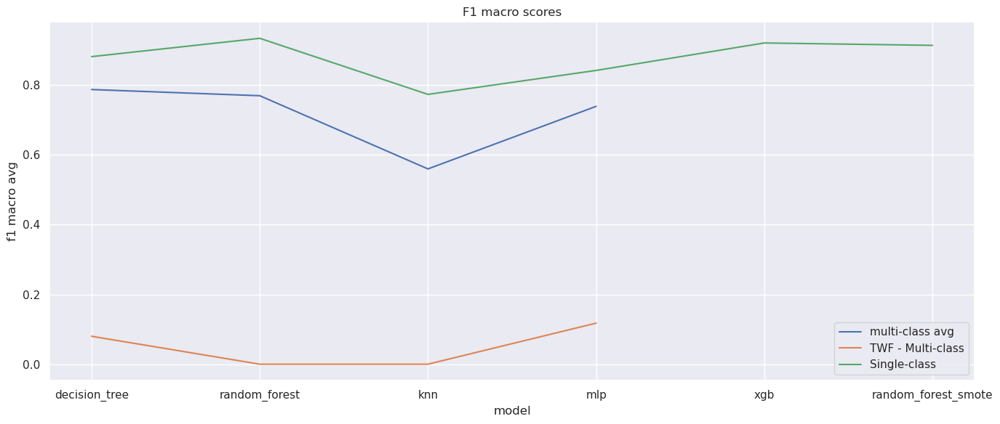

In [286]:
plt.figure(figsize=(14, 6))
sns.lineplot(x="model", y="f1 macro avg", data=scores_type, label="multi-class avg")
sns.lineplot(x="model", y="TWF", data=scores_type, label="TWF - Multi-class")
sns.lineplot(x="model", y="f1", data=f1_scores, label="Single-class")
#plt.xticks(rotation=90)  # Change x-axis label direction to vertical
plt.title("F1 macro scores")
plt.tight_layout()

## Model selection and export

In [287]:
%pip install m2cgen

Note: you may need to restart the kernel to use updated packages.


In [288]:
mf_collection["random_forest"]["best_model"]

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7f749d1d1400>),
                                                 ('cat',
                                                  OneHotEncoder(drop='first'),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7f749d1d0320>)])),
                ('classifier',
                 RandomForestClassifier(max_depth=13, n_estimators=982,
                                        random_state=666))])

In [289]:
import numpy as np

scaler = mf_collection["random_forest"]["best_model"].named_steps["preprocessor"].named_transformers_['num']
means = scaler.mean_.tolist()
stds = scaler.scale_.tolist()

print("Extracted Means:", means)
print("Extracted Standard Deviations:", stds)


Extracted Means: [299.9944611421211, 1538.6075568913698, 39.99918419922714, 107.2583369114069, 9.999656504937743, 6281.776013385104, 4291.273493631029]
Extracted Standard Deviations: [2.0039847111475804, 178.84461494862185, 9.955441771220384, 63.60454239556936, 0.9985390197593409, 1065.2462145897255, 2826.529272983146]


In [290]:
import m2cgen as m2c

rf_classifier = mf_collection["random_forest"]["best_model"].named_steps["classifier"]

if isinstance(rf_classifier.classes_, np.ndarray):
    rf_classifier.classes_ = rf_classifier.classes_.tolist()

c_code = m2c.export_to_c(rf_classifier)

with open("rf_mf_model.c", "w") as f:
    f.write(c_code)

RecursionError: maximum recursion depth exceeded

# TBD

In [376]:
from sklearn.tree import plot_tree, DecisionTreeClassifier

# Extract the Random Forest classifier from the pipeline
rf_model = multiclass.named_steps['classifier']
preprocessor = multiclass.named_steps['preprocessor']

all_feature_names = list(numerical_features)+list(preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_onehot_features))

# Visualize the structure of a single tree
tree = rf_model.estimators_[0]  # Access first tree
plt.figure(figsize=(90, 50))
plot_tree(tree, feature_names=all_feature_names, class_names=y_types_only.columns, filled=True, rounded=True)
plt.show()

AttributeError: 'dict' object has no attribute 'named_steps'

In [40]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

features_to_plot = [0, 4]

target_class = 0

PartialDependenceDisplay.from_estimator(
    rf_moddel,
    X_tedst,
    features_to_plot,
    feature_names=all_feature_names,
    grid_resolution=20,
    target=target_class
)
plt.show()

ValueError: object too deep for desired array

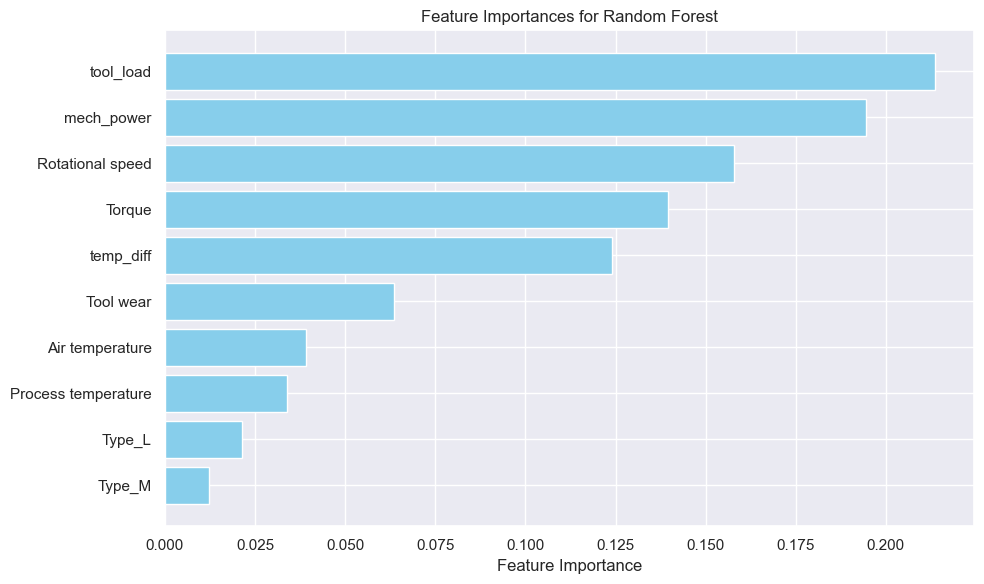

In [41]:
import pandas as pd
import matplotlib.pyplot as plt

numerical_features = ['Air temperature', 'Process temperature', 'Rotational speed', 'Torque',
                      'Tool wear'] + engineered_features
ohe = preprocessor_std_normalized_onehot_extended.named_transformers_['cat']
categorical_feature_names = ohe.get_feature_names_out(['Type'])
all_feature_names = list(numerical_features) + list(categorical_feature_names)

importance = rf_model.feature_importances_

importance_df = pd.DataFrame({
    'Feature': all_feature_names,
    'Importance': importance
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Feature Importances for Random Forest')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [64]:
from sklearn.inspection import PartialDepe
PartialDependenceDisplay.from_estimator(rf_model, X_test, features_to_plot, feature_names=all_feature_names,
                                        grid_resolution=20)
plt.show()

ValueError: target must be specified for multi-class

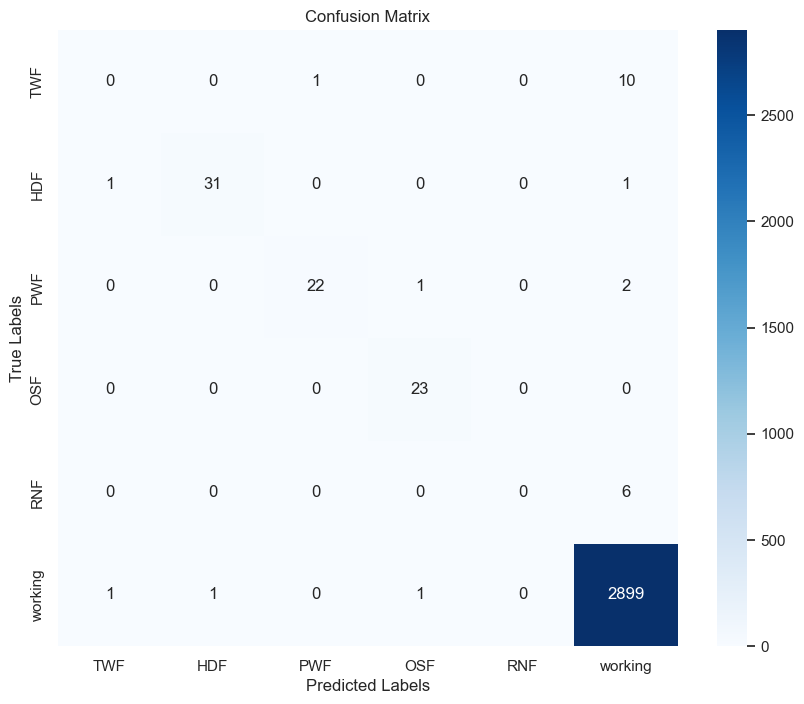

In [59]:
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels

conf_matrix = confusion_matrix(y_test.values.argmax(axis=1), y_pred.argmax(axis=1))
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", xticklabels=y_types_only.columns, yticklabels=y_types_only.columns, cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

#### Train & Report

#### Most relevant columns

In [36]:
cat_onehot = preprocessor.named_transformers_['cat']
categorical_feature_names = cat_onehot.get_feature_names_out(input_features=categorical_features)

all_feature_names = np.hstack([numerical_features, categorical_feature_names])

               Feature  Importance
3               Torque    0.322403
2     Rotational speed    0.231976
4            Tool wear    0.174873
0      Air temperature    0.133268
1  Process temperature    0.113970
6               Type_L    0.009593
7               Type_M    0.007236
5               Type_H    0.006681


<Axes: ylabel='Feature'>

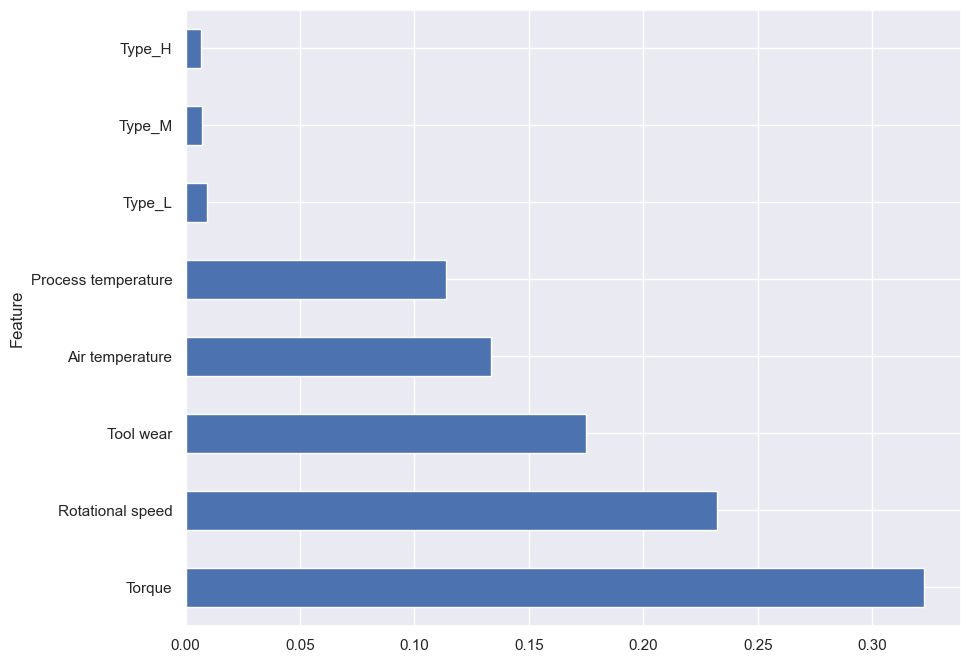

In [37]:
rf_model = model.named_steps['classifier']

importance_df = pd.DataFrame({
    'Feature': all_feature_names,
    'Importance': rf_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

print(importance_df)

importance_df.plot(kind='barh', x='Feature', y='Importance', figsize=(10, 8), legend=False)

# Regression

Plan: create remaining useful life (rul) as regression target